#Dataset
*StandordCars Dataset, which consists of around 8000 images in the train set*

In [ ]:
# import torch
# import torchvision
# import matplotlib.pyplot as plt

# def show_images(dataset, num_samples=20, cols=4):
#     """ Plots samples from the dataset """
#     plt.figure(figsize=(15,15))
#     for i, img in enumerate(dataset):
#         if i == num_samples:
#             break
#         plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
#         plt.imshow(img[0])

# data = torchvision.datasets.StanfordCars(root="./stanford_cars_dataset", download=False)
# show_images(data)

In [ ]:
# Install kagglehub
!pip install kagglehub

In [ ]:
import kagglehub
import os

print("Downloading dataset...")
dataset_download_path = kagglehub.dataset_download("jutrera/stanford-car-dataset-by-classes-folder")
print(f"Dataset downloaded to: {dataset_download_path}")

# Let's explore what's actually in the downloaded directory
print("\nExploring dataset structure:")
for root, dirs, files in os.walk(dataset_download_path):
    level = root.replace(dataset_download_path, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 2 * (level + 1)

# Try to find the correct image data path
possible_paths = [
    os.path.join(dataset_download_path, 'car_data', 'train'),
    os.path.join(dataset_download_path, 'train'),
    os.path.join(dataset_download_path, 'car_data', 'car_data', 'train'),  # Sometimes there's nested structure
    dataset_download_path  # Maybe the images are directly in the root
]

image_data_path = None
for path in possible_paths:
    if os.path.exists(path):
        image_data_path = path
        print(f"\nFound image data at: {path}")
        break

if image_data_path is None:
    print("\nCould not find image data in expected locations.")
    print("Please check the dataset structure manually.")
else:
    # Check if the path contains class subfolders
    subdirs = [d for d in os.listdir(image_data_path)
               if os.path.isdir(os.path.join(image_data_path, d))]

    if subdirs:
        print(f"\nFound {len(subdirs)} class subdirectories:")
        for i, subdir in enumerate(subdirs[:10]):  # Show first 10
            print(f"  - {subdir}")
        if len(subdirs) > 10:
            print(f"  ... and {len(subdirs) - 10} more")
    else:
        print(f"\nWarning: No class subdirectories found in {image_data_path}")
        print("The dataset might have a different structure than expected.")

print(f"\nUsing image data path: {image_data_path}")

Using Colab cache for faster access to the 'stanford-car-dataset-by-classes-folder' dataset.
Dataset downloaded to: /kaggle/input/stanford-car-dataset-by-classes-folder

Exploring dataset structure:
stanford-car-dataset-by-classes-folder/
  car_data/
    car_data/
      test/
        Dodge Ram Pickup 3500 Crew Cab 2010/
        Cadillac CTS-V Sedan 2012/
        Audi S5 Convertible 2012/
        Ram C-V Cargo Van Minivan 2012/
        smart fortwo Convertible 2012/
        Audi V8 Sedan 1994/
        Suzuki Kizashi Sedan 2012/
        Chevrolet Express Van 2007/
        Chrysler Town and Country Minivan 2012/
        Rolls-Royce Phantom Sedan 2012/
        Buick Regal GS 2012/
        Aston Martin V8 Vantage Convertible 2012/
        Rolls-Royce Phantom Drophead Coupe Convertible 2012/
        Audi TT Hatchback 2011/
        Chevrolet Malibu Hybrid Sedan 2010/
        Honda Odyssey Minivan 2012/
        BMW X6 SUV 2012/
        Audi 100 Wagon 1994/
        Volvo 240 Sedan 1993/
       

Number of classes: 196
Classes: ['AM General Hummer SUV 2000', 'Acura Integra Type R 2001', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008']...
Number of images: 8144


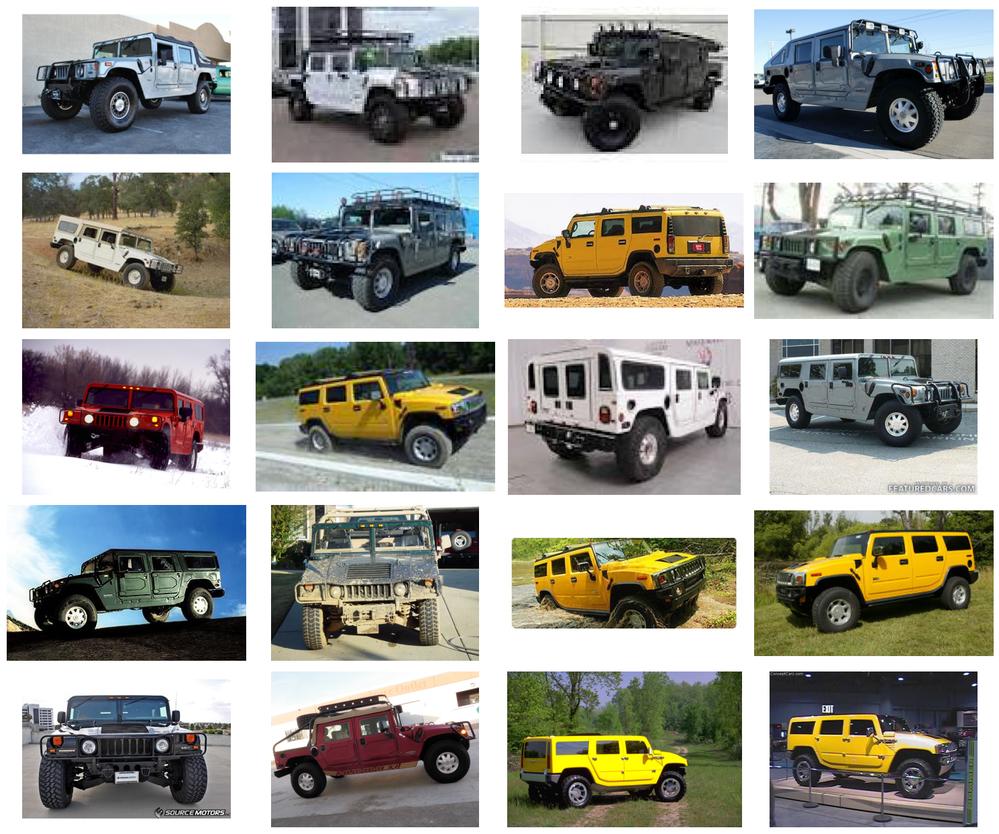

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt

def show_images(dataset, num_samples=20, cols=4):
    """ Plots samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, item in enumerate(dataset):
        if i == num_samples:
            break
        # ImageFolder returns (PIL_Image, label) by default without transform
        # plt.imshow can directly handle PIL_Image.
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(item[0]) # item[0] is the PIL Image
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Load the dataset using ImageFolder, assuming 'image_data_path' is defined in a previous cell.
# No transform specified, so it will return PIL Images directly.
data = torchvision.datasets.ImageFolder(root=image_data_path)

# Print some information about the loaded dataset
print(f"Number of classes: {len(data.classes)}")
print(f"Classes: {data.classes[:5]}...") # Show first 5 classes
print(f"Number of images: {len(data)}")

show_images(data)

#Building the Diffiusion Model

# Step 1: The Fwd process, Noise Scheduler

In [ ]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Test

Total number of images loaded: 16185
Shape of one batch: torch.Size([128, 3, 64, 64])


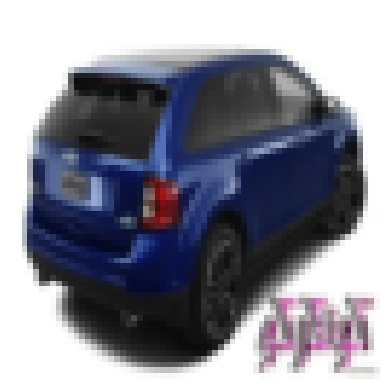

In [ ]:
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt # Added to support show_tensor_image
import os # Added for path manipulation

IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    # image_data_path contains the path to the 'train' folder
    train_root_path = image_data_path
    # Construct the path for the 'test' folder using dataset_download_path
    test_root_path = os.path.join(dataset_download_path, 'car_data', 'car_data', 'test')

    train_dataset = datasets.ImageFolder(root=train_root_path, transform=data_transform)
    test_dataset = datasets.ImageFolder(root=test_root_path, transform=data_transform)

    return torch.utils.data.ConcatDataset([train_dataset, test_dataset])

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))
    plt.axis('off') # Hide axes for cleaner image display
    plt.show()

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

print(f"Total number of images loaded: {len(data)}")

# Optional: show a sample image from the dataloader
for batch in dataloader:
    images, _ = batch
    print(f"Shape of one batch: {images.shape}")
    show_tensor_image(images[0])
    break

Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])
Image shape: torch.Size([128, 3, 64, 64])


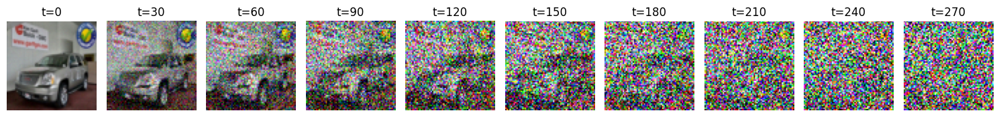

In [ ]:
import matplotlib.pyplot as plt

# Simulate forward diffusion
image = next(iter(dataloader))[0]

fig, axes = plt.subplots(1, 10, figsize=(15, 3))
num_images = 10
stepsize = int(T/num_images)

for i, idx in enumerate(range(0, T, stepsize)):
    t = torch.Tensor([idx]).type(torch.int64)
    img, noise = forward_diffusion_sample(image, t)

    print(f"Image shape: {img.shape}")

    # Convert tensor to displayable format - handle different possible shapes
    if len(img.shape) == 4:  # [batch, channels, height, width]
        img_display = img[0]  # Take first image in batch
    else:
        img_display = img

    # permute and process
    img_display = img_display.permute(1, 2, 0)
    img_display = img_display * 0.5 + 0.5
    img_display = img_display.clamp(0, 1)


    axes[i].imshow(img_display.detach().numpy())
    axes[i].axis('off')
    axes[i].set_title(f't={idx}')

plt.tight_layout()
plt.show()

## Step 2: The backward process = U-Net

In [ ]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
- ...

# Setp 3: Loss

In [ ]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

#Sampling

In [ ]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

#Training

Epoch 0 | step 000 Loss: 0.8112685084342957 


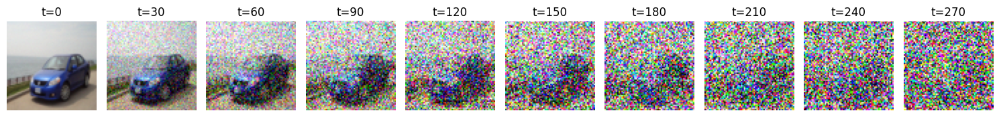

Epoch 5 | step 000 Loss: 0.17265939712524414 


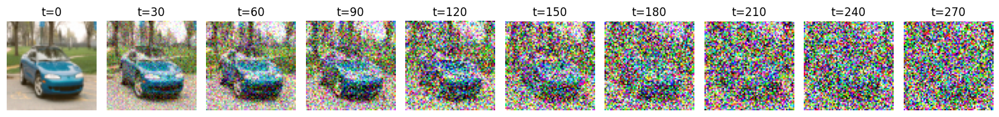

Epoch 10 | step 000 Loss: 0.16267810761928558 


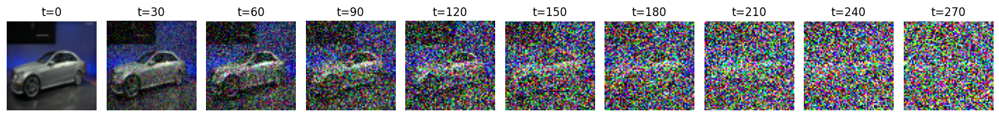

Epoch 15 | step 000 Loss: 0.13436196744441986 


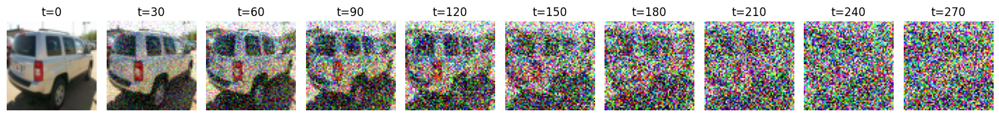

Epoch 20 | step 000 Loss: 0.1482529640197754 


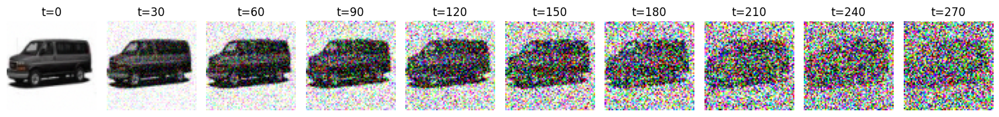

Epoch 25 | step 000 Loss: 0.1448468565940857 


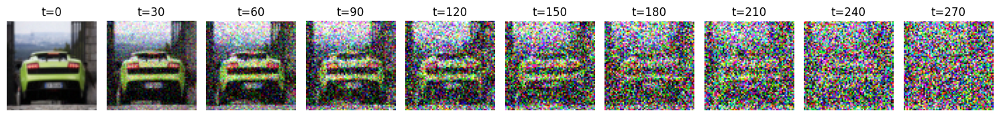

Epoch 30 | step 000 Loss: 0.13936029374599457 


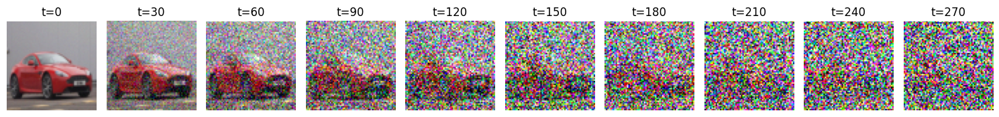

Epoch 35 | step 000 Loss: 0.13683775067329407 


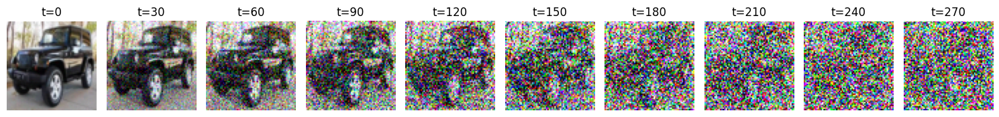

Epoch 40 | step 000 Loss: 0.14623576402664185 


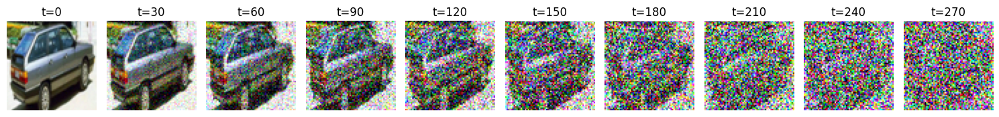

Epoch 45 | step 000 Loss: 0.14647796750068665 


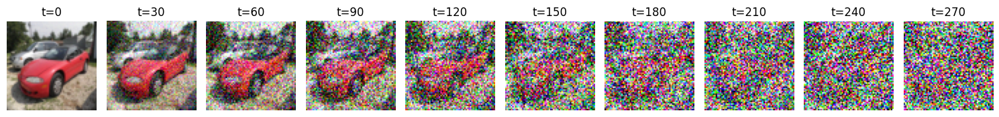

Epoch 50 | step 000 Loss: 0.13666710257530212 


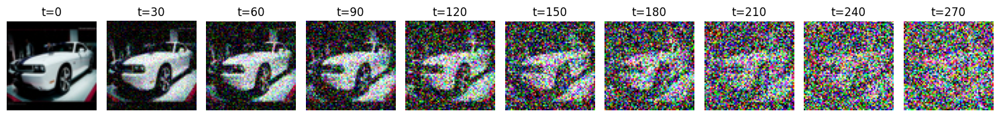

Epoch 55 | step 000 Loss: 0.14112943410873413 


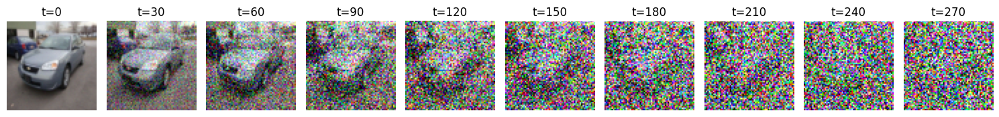

Epoch 60 | step 000 Loss: 0.14270082116127014 


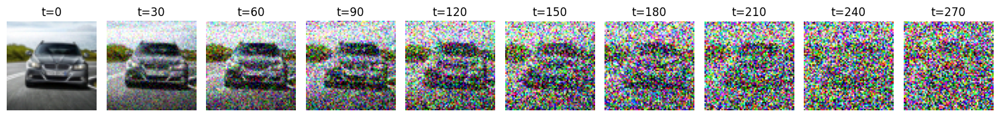

Epoch 65 | step 000 Loss: 0.13354912400245667 


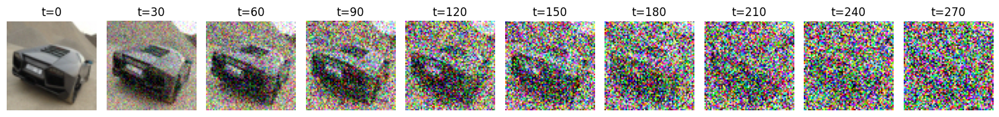

Epoch 70 | step 000 Loss: 0.13651610910892487 


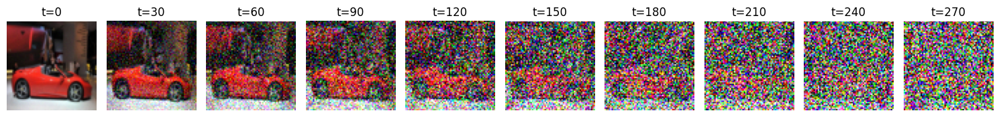

Epoch 75 | step 000 Loss: 0.12328527867794037 


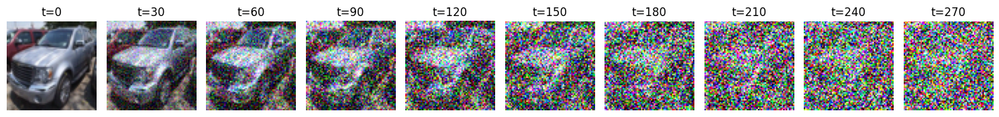

Epoch 80 | step 000 Loss: 0.1329343616962433 


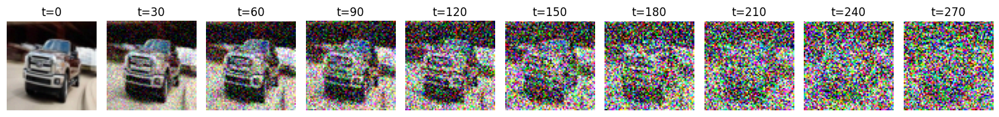

Epoch 85 | step 000 Loss: 0.12670651078224182 


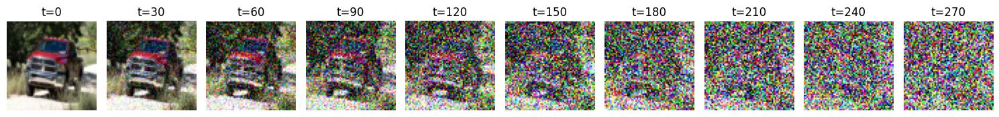

Epoch 90 | step 000 Loss: 0.14467591047286987 


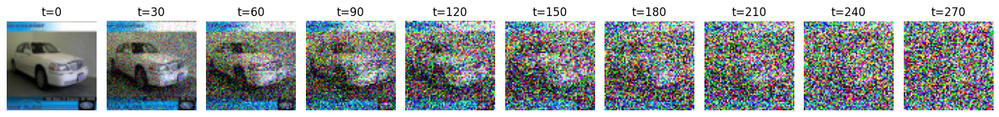

Epoch 95 | step 000 Loss: 0.12863703072071075 


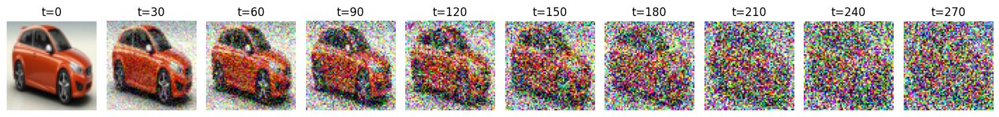

In [ ]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()